# **Machine Learning Models for Predictive Maintenance**

---

In this notebook, we explore and compare various machine learning models to predict machine failure in a predictive maintenance dataset. The models used include:

1. **XGBoost Classifier**
2. **Bagging Classifier with Decision Tree**
3. **Bagging Classifier with Logistic Regression**
4. **Random Forest Classifier**

Each model is trained and evaluated to determine its effectiveness in identifying machine failures based on the dataset features.


**XGBoost Classifier**

   UDI Product_ID Type  Air_temperature_K  Process_temperature_K  \
0    1     M14860    M              298.1                  308.6   
1    2     L47181    L              298.2                  308.7   
2    3     L47182    L              298.1                  308.5   
3    4     L47183    L              298.2                  308.6   
4    5     L47184    L              298.2                  308.7   
5    6     M14865    M              298.1                  308.6   
6    7     L47186    L              298.1                  308.6   
7    8     L47187    L              298.1                  308.6   
8    9     M14868    M              298.3                  308.7   
9   10     M14869    M              298.5                  309.0   

   Rotational_speed_rpm  Torque_Nm  Tool_wear_min  Machine_failure  TWF  HDF  \
0                  1551       42.8              0                0    0    0   
1                  1408       46.3              3                0    0    0   
2          

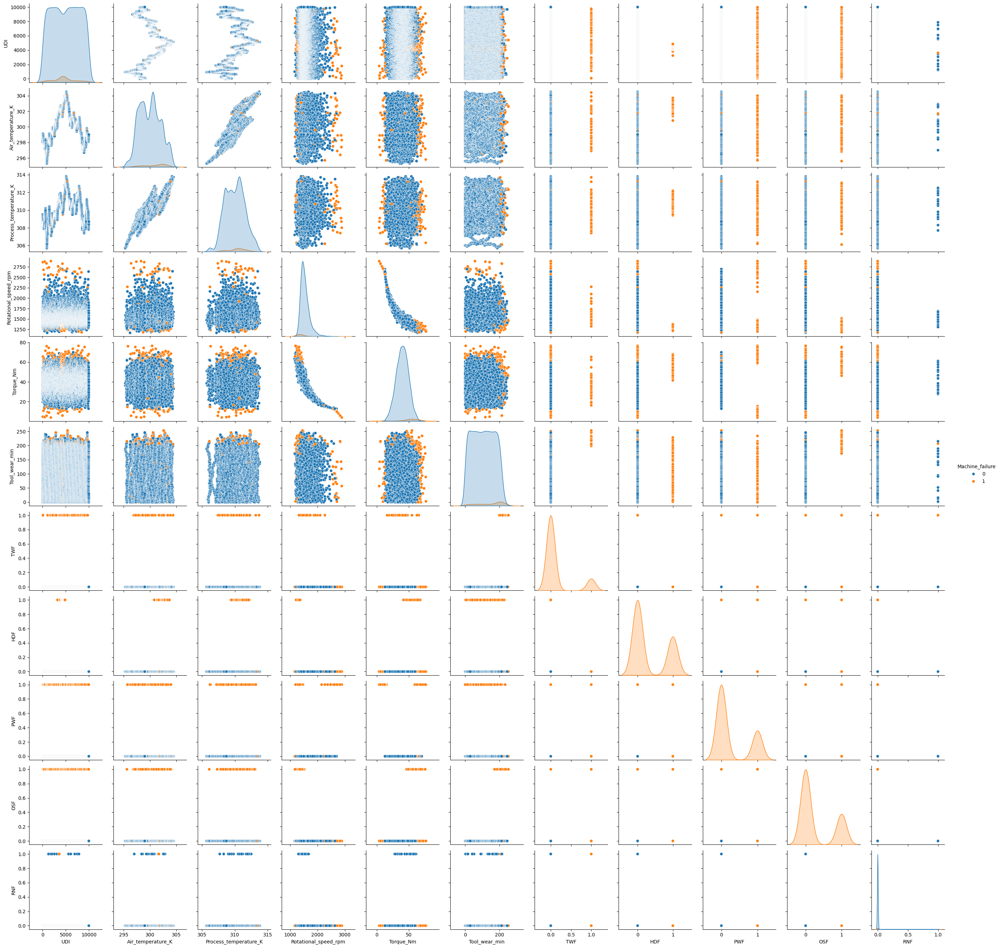

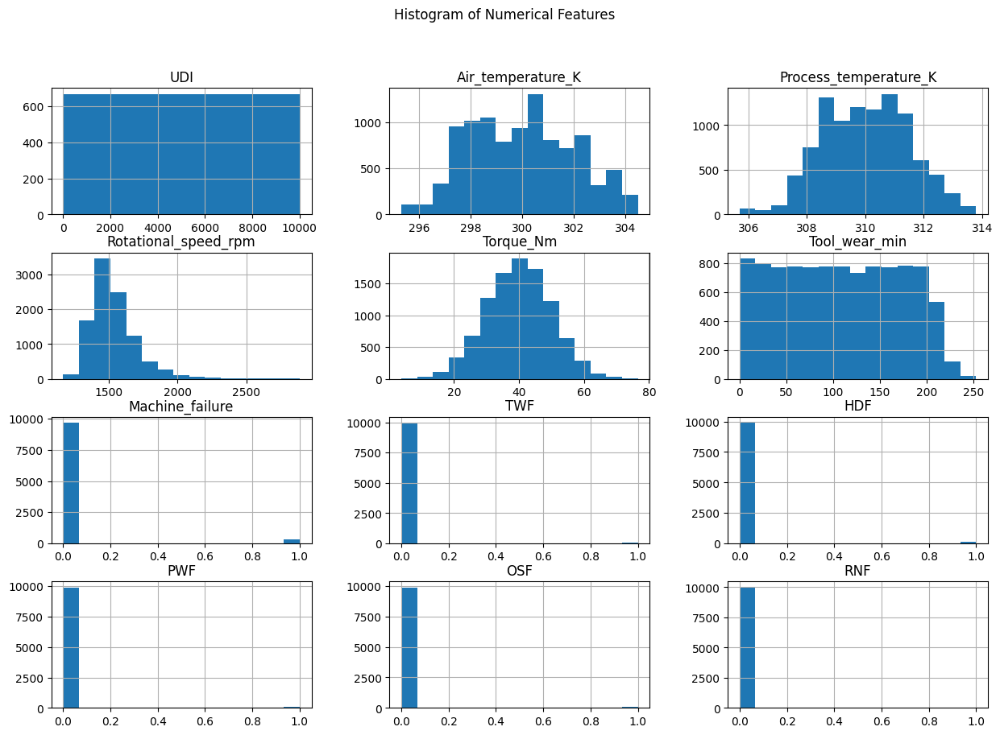

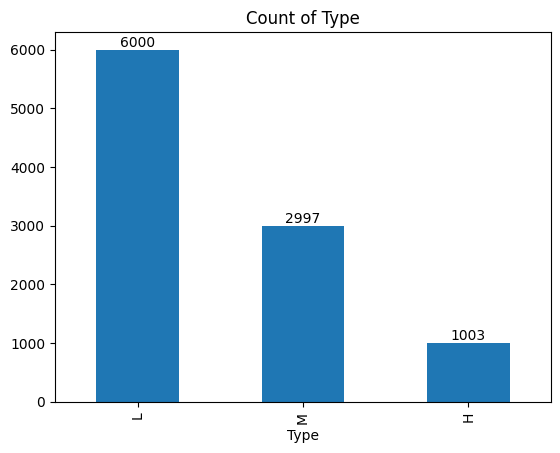

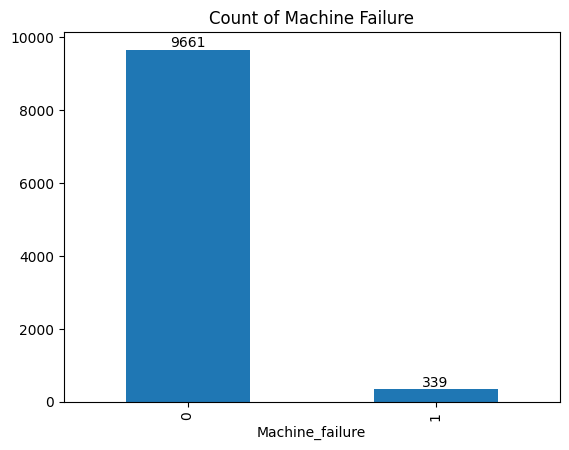

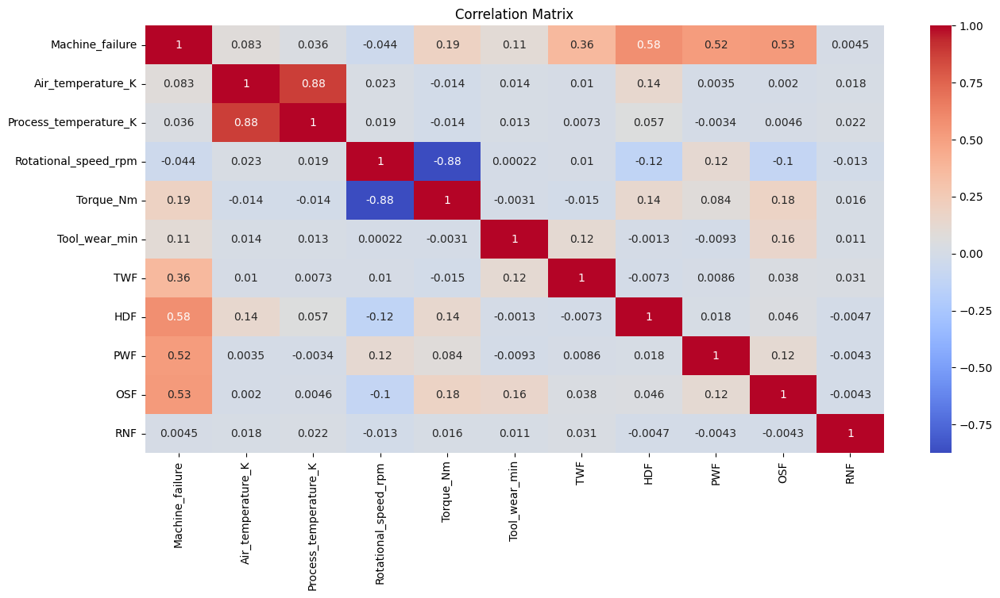

Confusion Matrix:
[[1932    7]
 [  22   39]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1939
           1       0.85      0.64      0.73        61

    accuracy                           0.99      2000
   macro avg       0.92      0.82      0.86      2000
weighted avg       0.98      0.99      0.98      2000



In [ ]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('ai4i2020.csv')

# Clean column names for compatibility with XGBoost
df.columns = df.columns.str.replace('[\[\]<>]', '', regex=True).str.replace(' ', '_')

# Display initial data information
print(df.head(10))
print(df.info())
print(df.describe().T)
print("Number of unique values per column:\n", df.nunique())
print("Number of duplicate rows:", df.duplicated().sum())

# Visualize the distribution of each feature
sns.pairplot(df, hue="Machine_failure", diag_kind='kde')
plt.show()

# Histograms of numerical features
df.hist(bins=15, figsize=(15, 10))
plt.suptitle("Histogram of Numerical Features")
plt.show()

# Bar plot of 'Type' column
type_counts = df['Type'].value_counts()
ax = type_counts.plot(kind='bar', title='Count of Type')

# Annotate each bar with its count
for i, count in enumerate(type_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

# Bar plot of 'Machine failure' column
failure_counts = df['Machine_failure'].value_counts()
ax = failure_counts.plot(kind='bar', title='Count of Machine Failure')

# Annotate each bar with its count
for i, count in enumerate(failure_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

# Correlation matrix for selected columns
columns = ['Machine_failure', 'Air_temperature_K', 'Process_temperature_K',
           'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min',
           'TWF', 'HDF', 'PWF', 'OSF', 'RNF']
df_subset = df[columns]

# Plot the heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(df_subset.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

# Feature and label selection
X = df[['Air_temperature_K', 'Process_temperature_K', 'Rotational_speed_rpm',
        'Torque_Nm', 'Tool_wear_min']]
y = df['Machine_failure']

# Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Import XGBoost and train the model
from xgboost import XGBClassifier
xgb_model = XGBClassifier(n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions and evaluate the model
from sklearn.metrics import classification_report, confusion_matrix
y_pred_xgb = xgb_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_xgb))

print("\nClassification Report:")
print(classification_report(y_test, y_pred_xgb))


**Bagging Classifier** with a **Decision Tree Classifier** as its ***base estimator***

   UDI Product_ID Type  Air_temperature_K  Process_temperature_K  \
0    1     M14860    M              298.1                  308.6   
1    2     L47181    L              298.2                  308.7   
2    3     L47182    L              298.1                  308.5   
3    4     L47183    L              298.2                  308.6   
4    5     L47184    L              298.2                  308.7   
5    6     M14865    M              298.1                  308.6   
6    7     L47186    L              298.1                  308.6   
7    8     L47187    L              298.1                  308.6   
8    9     M14868    M              298.3                  308.7   
9   10     M14869    M              298.5                  309.0   

   Rotational_speed_rpm  Torque_Nm  Tool_wear_min  Machine_failure  TWF  HDF  \
0                  1551       42.8              0                0    0    0   
1                  1408       46.3              3                0    0    0   
2          

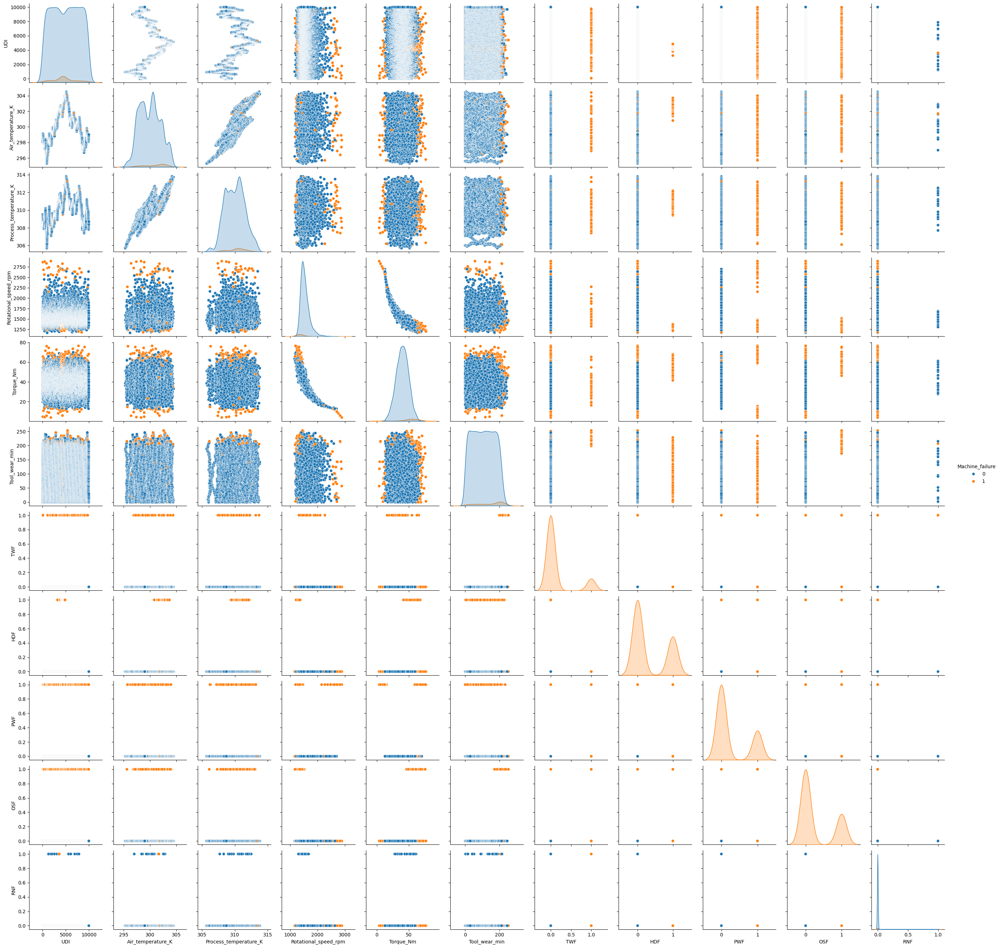

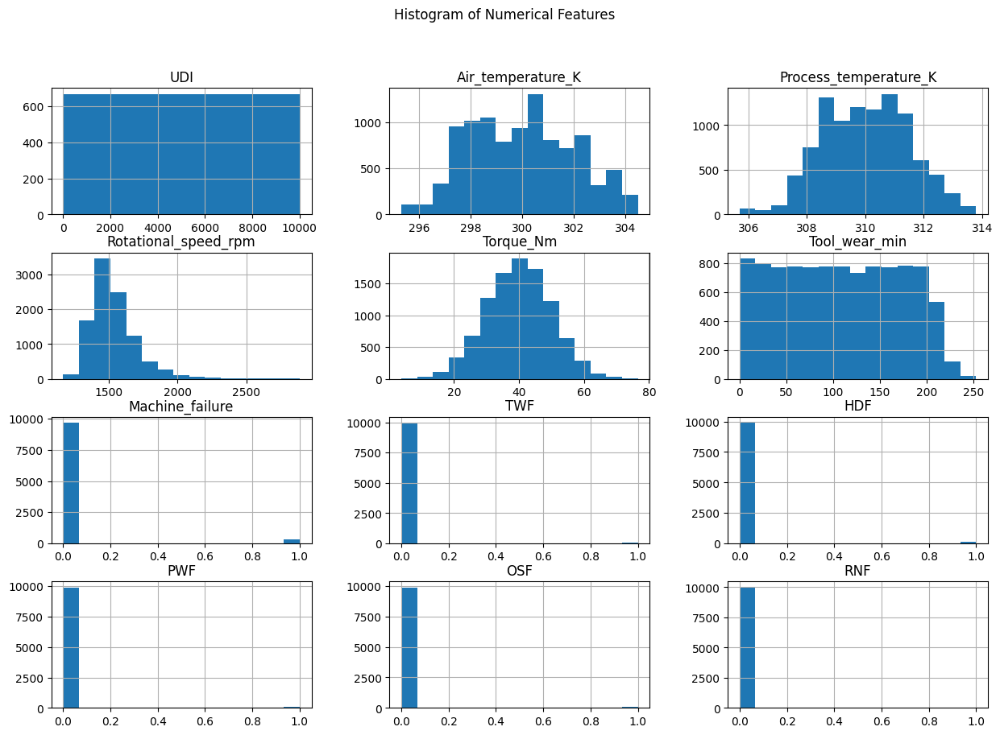

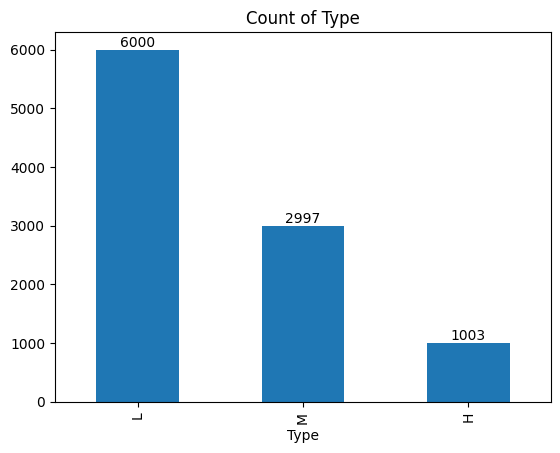

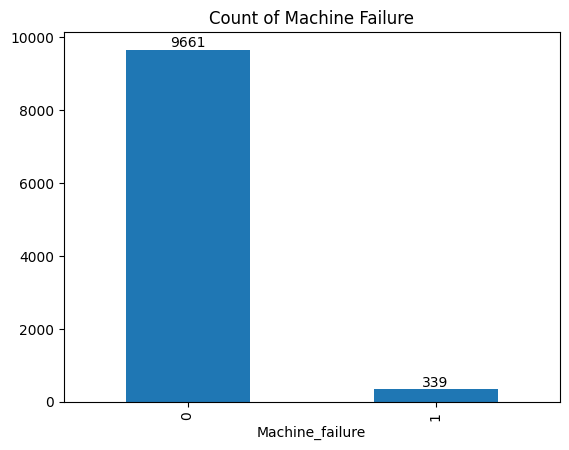

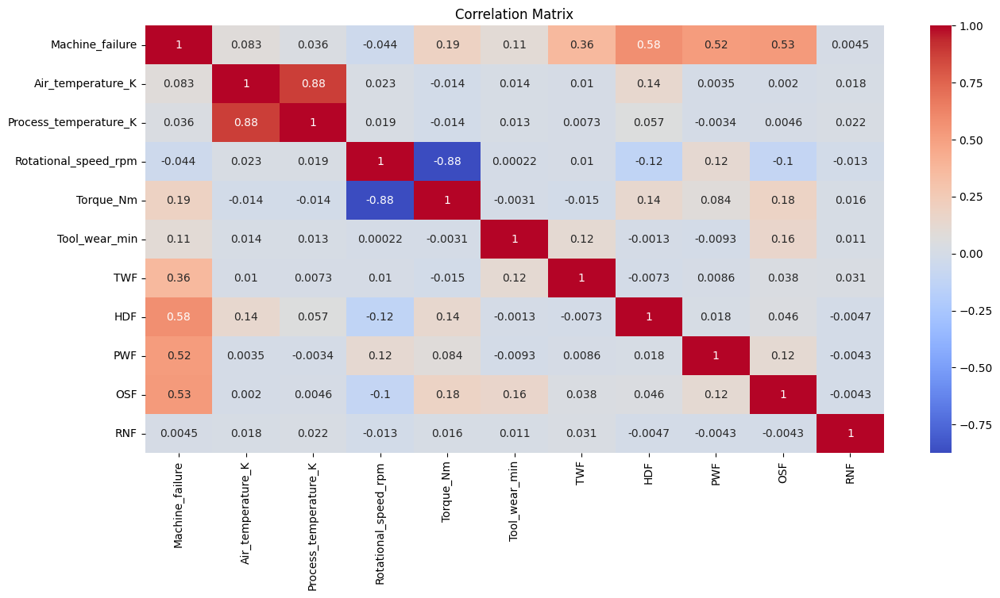

Confusion Matrix:
[[1932    7]
 [  18   43]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1939
           1       0.86      0.70      0.77        61

    accuracy                           0.99      2000
   macro avg       0.93      0.85      0.88      2000
weighted avg       0.99      0.99      0.99      2000



['models/model_columns.pkl']

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# Ensure the 'models' directory exists
os.makedirs('models', exist_ok=True)

# Load the data
df = pd.read_csv('ai4i2020.csv')

# Clean column names for compatibility
df.columns = df.columns.str.replace('[\[\]<>]', '', regex=True).str.replace(' ', '_')

# Display initial data information
print(df.head(10))
print(df.info())
print(df.describe().T)
print("Number of unique values per column:\n", df.nunique())
print("Number of duplicate rows:", df.duplicated().sum())

# Visualize the distribution of each feature
sns.pairplot(df, hue="Machine_failure", diag_kind='kde')
plt.show()

# Histograms of numerical features
df.hist(bins=15, figsize=(15, 10))
plt.suptitle("Histogram of Numerical Features")
plt.show()

# Bar plot of 'Type' column
type_counts = df['Type'].value_counts()
ax = type_counts.plot(kind='bar', title='Count of Type')

# Annotate each bar with its count
for i, count in enumerate(type_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

# Bar plot of 'Machine failure' column
failure_counts = df['Machine_failure'].value_counts()
ax = failure_counts.plot(kind='bar', title='Count of Machine Failure')

# Annotate each bar with its count
for i, count in enumerate(failure_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

# Correlation matrix for selected columns
columns = ['Machine_failure', 'Air_temperature_K', 'Process_temperature_K',
           'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min',
           'TWF', 'HDF', 'PWF', 'OSF', 'RNF']
df_subset = df[columns]

# Plot the heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(df_subset.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

# Feature and label selection
X = df[['Air_temperature_K', 'Process_temperature_K', 'Rotational_speed_rpm',
        'Torque_Nm', 'Tool_wear_min']]
y = df['Machine_failure']

# Split the data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Import DecisionTreeClassifier and BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier

# Initialize a BaggingClassifier with DecisionTreeClassifier as the base estimator
bagging_model = BaggingClassifier(estimator=DecisionTreeClassifier(),
                                  n_estimators=100, random_state=42)
bagging_model.fit(X_train, y_train)

# Make predictions and evaluate the model
from sklearn.metrics import classification_report, confusion_matrix
y_pred_bagging = bagging_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_bagging))

print("\nClassification Report:")
print(classification_report(y_test, y_pred_bagging))

# Save the model, scaler, and column names
joblib.dump(bagging_model, 'models/predictive_maintenance_model.pkl')
joblib.dump(scaler, 'models/scaler.pkl')
joblib.dump(X.columns.tolist(), 'models/model_columns.pkl')


**Bagging Classifier** with **Logistic Regression** as its ***base estimator***

   UDI Product_ID Type  Air_temperature_K  Process_temperature_K  \
0    1     M14860    M              298.1                  308.6   
1    2     L47181    L              298.2                  308.7   
2    3     L47182    L              298.1                  308.5   
3    4     L47183    L              298.2                  308.6   
4    5     L47184    L              298.2                  308.7   
5    6     M14865    M              298.1                  308.6   
6    7     L47186    L              298.1                  308.6   
7    8     L47187    L              298.1                  308.6   
8    9     M14868    M              298.3                  308.7   
9   10     M14869    M              298.5                  309.0   

   Rotational_speed_rpm  Torque_Nm  Tool_wear_min  Machine_failure  TWF  HDF  \
0                  1551       42.8              0                0    0    0   
1                  1408       46.3              3                0    0    0   
2          

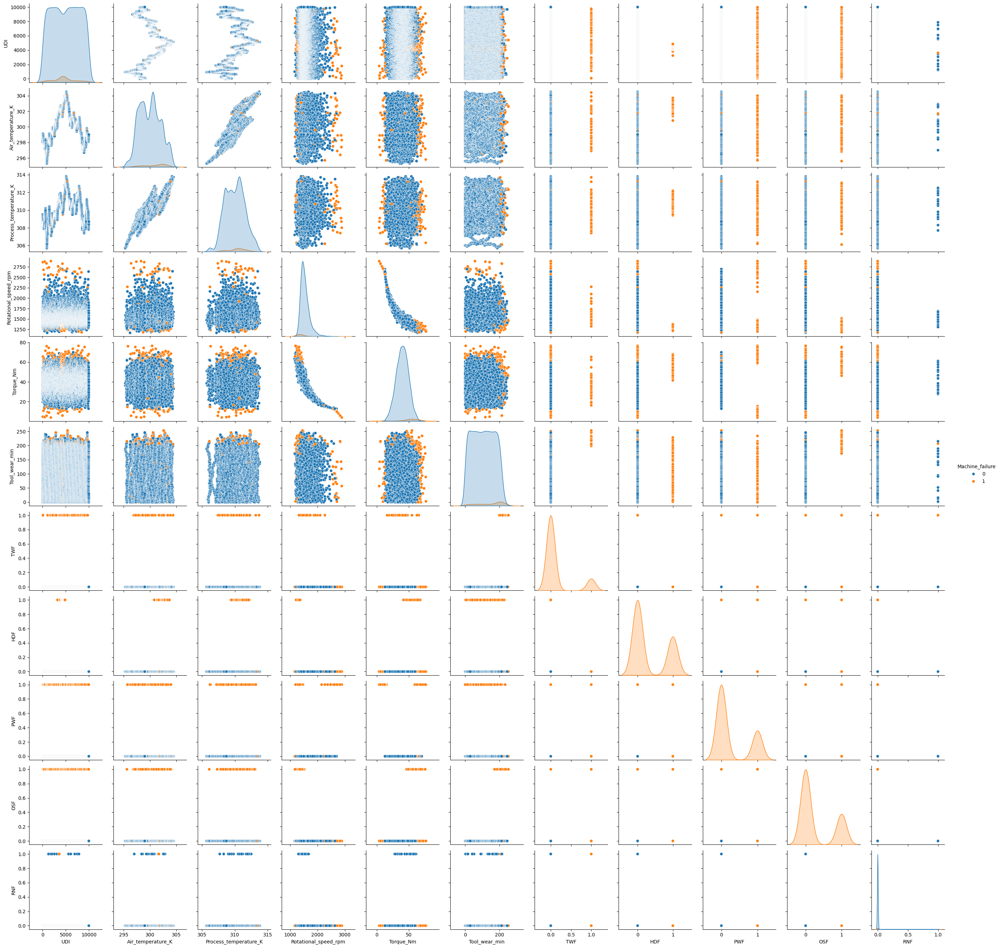

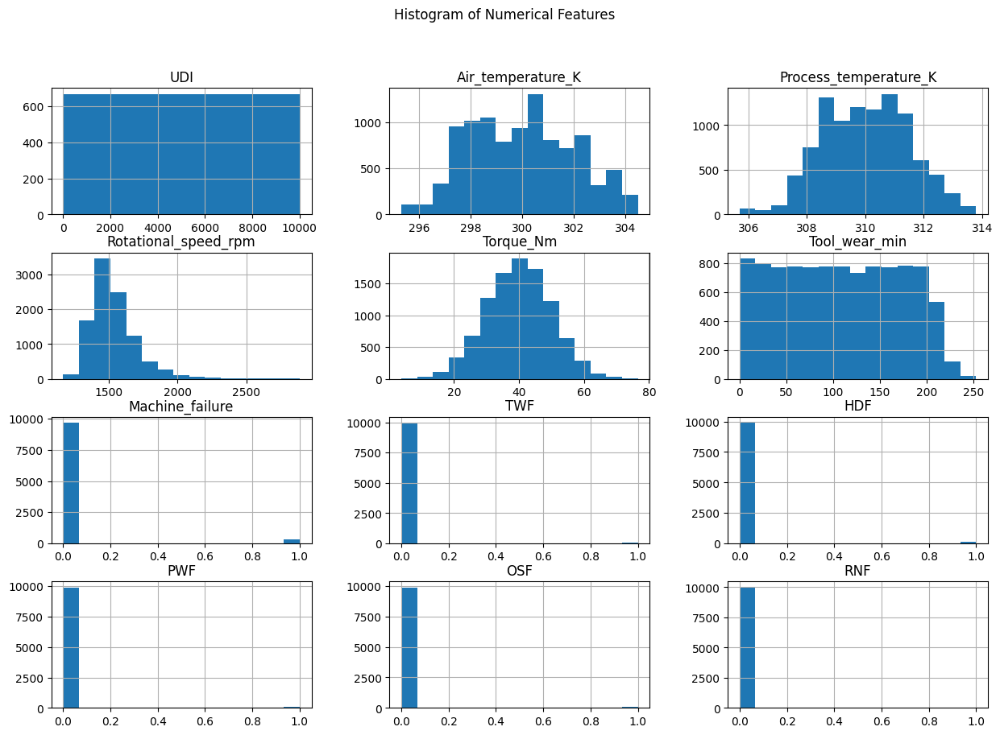

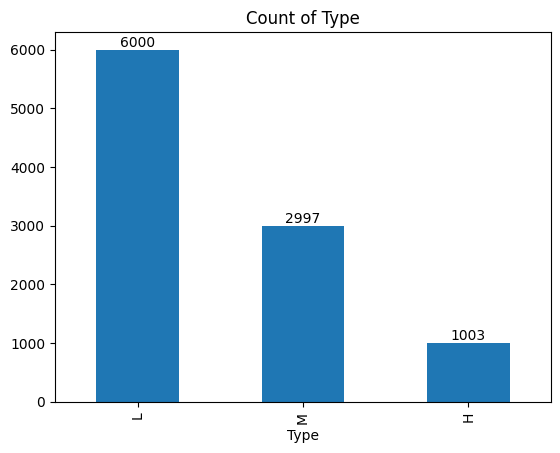

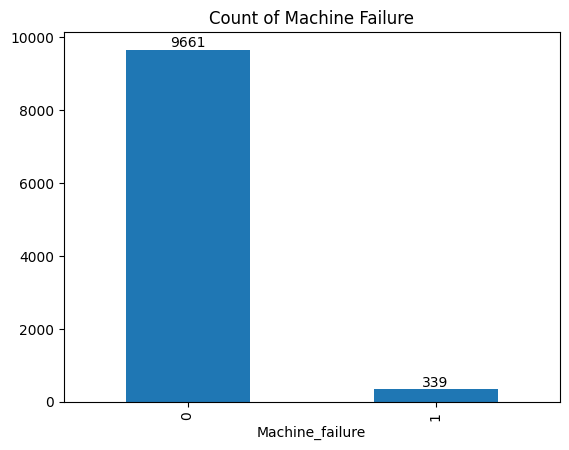

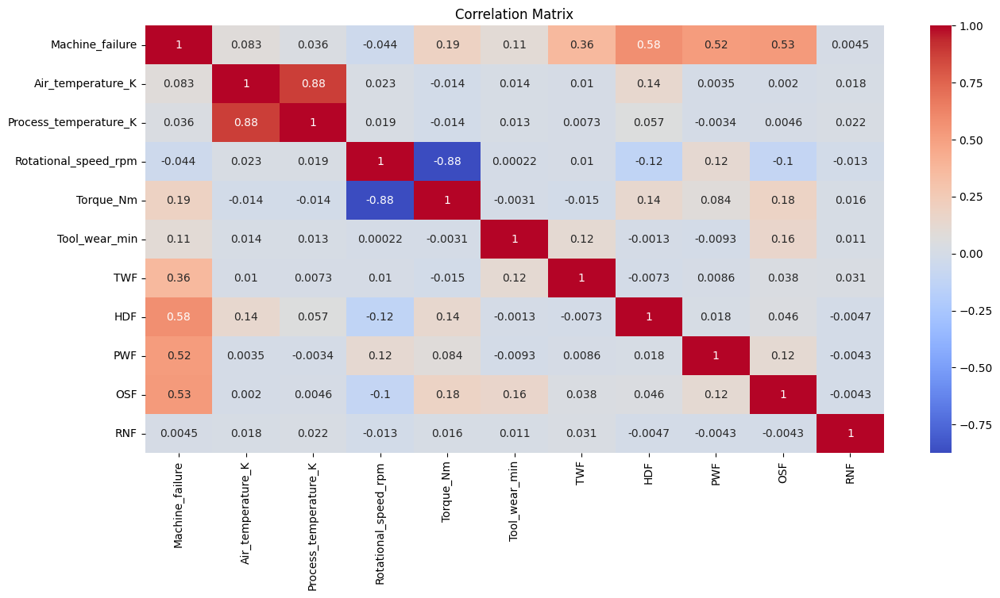

Confusion Matrix:
[[1929   10]
 [  45   16]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1939
           1       0.62      0.26      0.37        61

    accuracy                           0.97      2000
   macro avg       0.80      0.63      0.68      2000
weighted avg       0.97      0.97      0.97      2000



In [ ]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('ai4i2020.csv')

# Clean column names for compatibility
df.columns = df.columns.str.replace('[\[\]<>]', '', regex=True).str.replace(' ', '_')

# Display initial data information
print(df.head(10))
print(df.info())
print(df.describe().T)
print("Number of unique values per column:\n", df.nunique())
print("Number of duplicate rows:", df.duplicated().sum())

# Visualize the distribution of each feature
sns.pairplot(df, hue="Machine_failure", diag_kind='kde')
plt.show()

# Histograms of numerical features
df.hist(bins=15, figsize=(15, 10))
plt.suptitle("Histogram of Numerical Features")
plt.show()

# Bar plot of 'Type' column
type_counts = df['Type'].value_counts()
ax = type_counts.plot(kind='bar', title='Count of Type')

# Annotate each bar with its count
for i, count in enumerate(type_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

# Bar plot of 'Machine failure' column
failure_counts = df['Machine_failure'].value_counts()
ax = failure_counts.plot(kind='bar', title='Count of Machine Failure')

# Annotate each bar with its count
for i, count in enumerate(failure_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')
plt.show()

# Correlation matrix for selected columns
columns = ['Machine_failure', 'Air_temperature_K', 'Process_temperature_K',
           'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min',
           'TWF', 'HDF', 'PWF', 'OSF', 'RNF']
df_subset = df[columns]

# Plot the heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(df_subset.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

# Feature and label selection
X = df[['Air_temperature_K', 'Process_temperature_K', 'Rotational_speed_rpm',
        'Torque_Nm', 'Tool_wear_min']]
y = df['Machine_failure']

# Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Import LogisticRegression and BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier

# Initialize a BaggingClassifier with LogisticRegression as the base estimator
bagging_model = BaggingClassifier(estimator=LogisticRegression(max_iter=1000),
                                  n_estimators=100, random_state=42)
bagging_model.fit(X_train, y_train)

# Make predictions and evaluate the model
from sklearn.metrics import classification_report, confusion_matrix
y_pred_bagging = bagging_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_bagging))

print("\nClassification Report:")
print(classification_report(y_test, y_pred_bagging))


**Random Forest Classifier**

1.5.2
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
 9   TWF                      10000 non-null  int64  
 10  HDF                      10000 non-null  int64  
 11  PWF                      10000 non-null  int64  
 12  OSF                      10000 non-null  int64  
 13  RNF                      10000 non-null  int64  
dtypes: float64(3), in

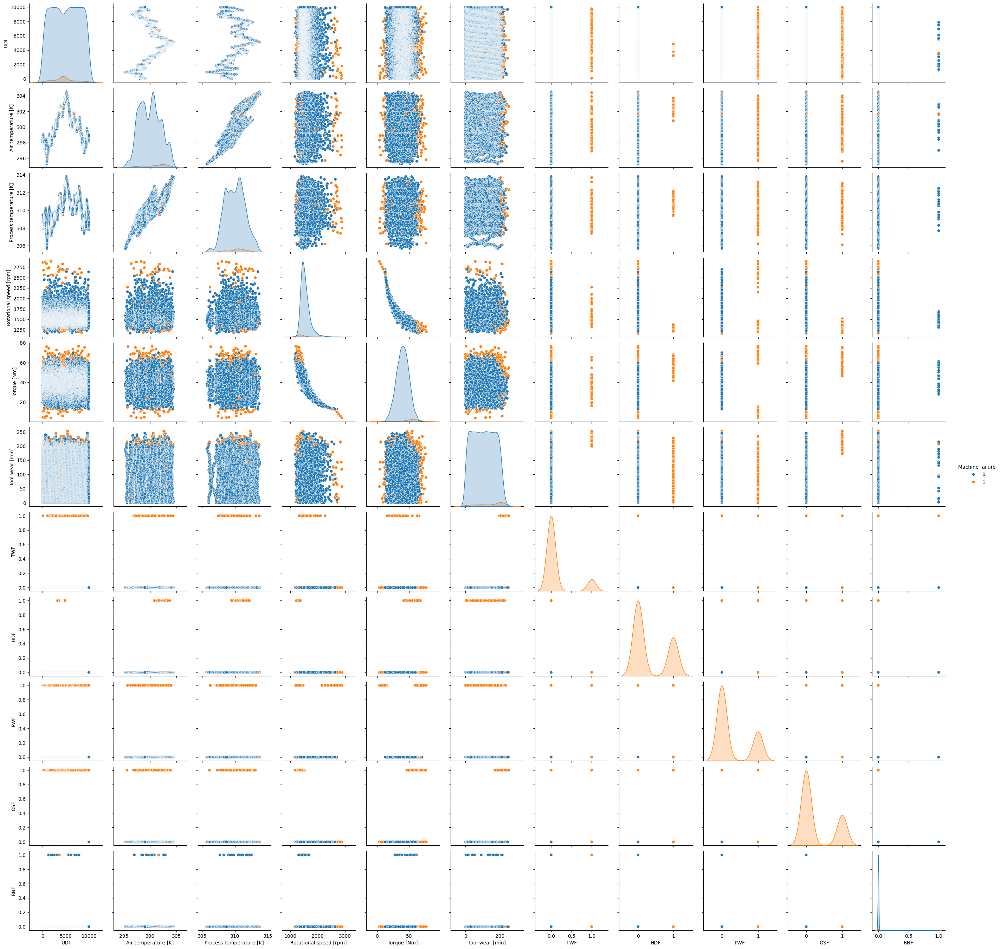

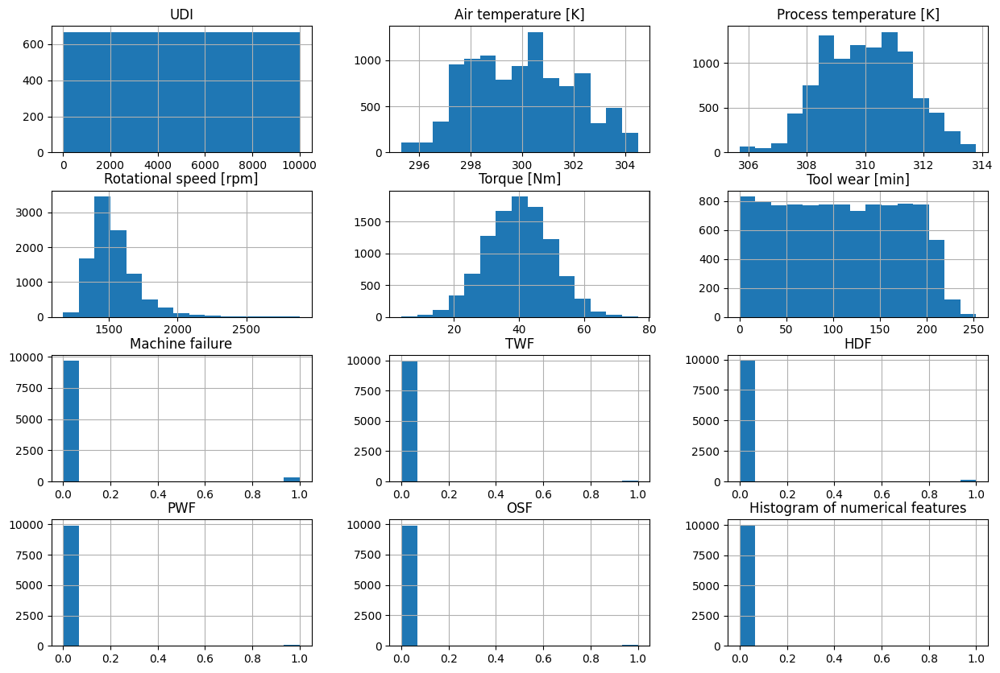

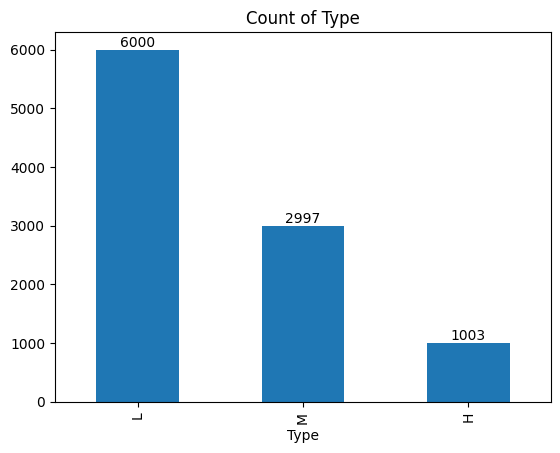

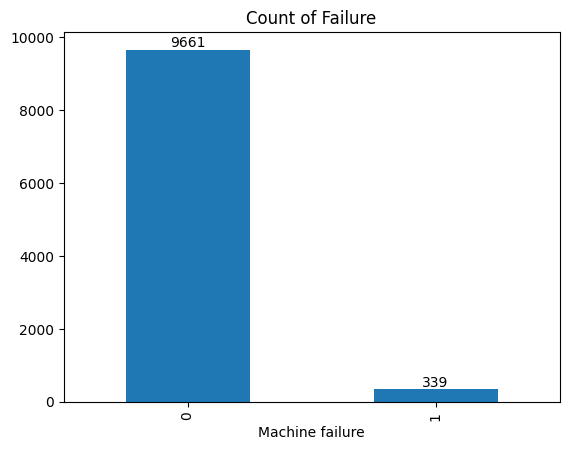

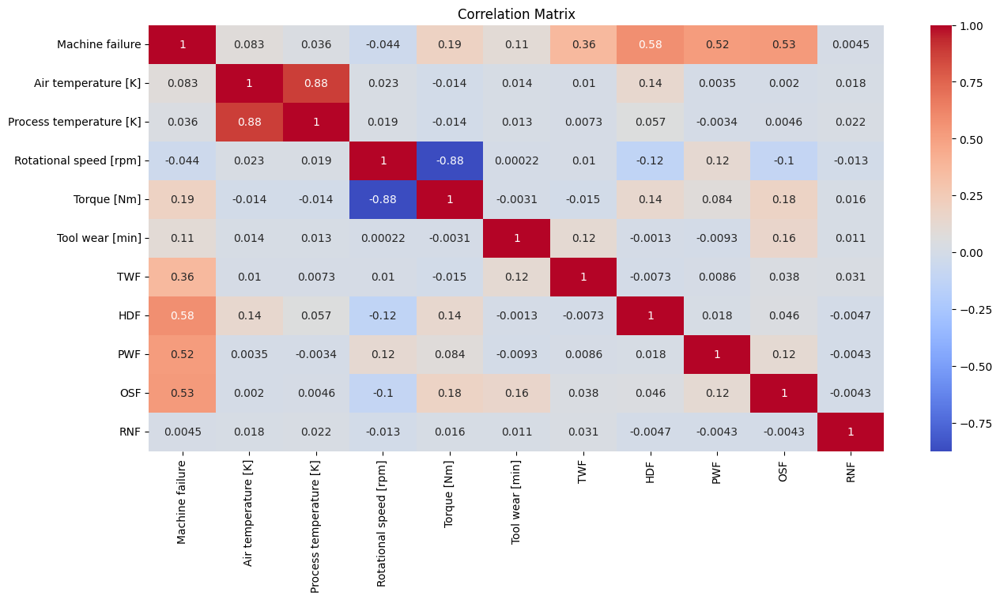

[[1931    8]
 [  25   36]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1939
           1       0.82      0.59      0.69        61

    accuracy                           0.98      2000
   macro avg       0.90      0.79      0.84      2000
weighted avg       0.98      0.98      0.98      2000



In [ ]:
import sklearn
print(sklearn.__version__)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('ai4i2020.csv')

df.head(10)
df.info()
df.describe().T
df.nunique()
df.duplicated().sum()

# Visualize the distribution of each feature
sns.pairplot(df, hue="Machine failure", diag_kind='kde')
plt.show()

df.hist(bins=15, figsize=(15, 10))
plt.title("Histogram of numerical features")
plt.show()

type_counts = df['Type'].value_counts()
ax = type_counts.plot(kind='bar', x='Type', y='Count', title='Count of Type')

# Annotate each bar with its count
for i, count in enumerate(type_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')

plt.show()

failure_counts = df['Machine failure'].value_counts()
ax = failure_counts.plot(kind='bar', x='Failure', y='Count', title='Count of Failure')

# Annotate each bar with its count
for i, count in enumerate(failure_counts):
    ax.text(i, count + 0.1, str(count), ha='center', va='bottom')

plt.show()

# List of columns to include in the correlation matrix
columns = ['Machine failure', 'Air temperature [K]', 'Process temperature [K]',
           'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]',
           'TWF', 'HDF', 'PWF', 'OSF', 'RNF']

# Subset the DataFrame to include only the desired columns
df_subset = df[columns]

# Compute the correlation matrix
corr_matrix = df_subset.corr()

# Plot the heatmap
plt.figure(figsize=(15, 7))  # Set the size
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

# Feature and label selection
X = df[['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]',
        'Torque [Nm]', 'Tool wear [min]']]
y = df['Machine failure']

# Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
